In [7]:
#Python imports
import pandas as pd
import numpy as np

#Visualization imports
import matplotlib.pyplot as plt
import seaborn as sns


# Wrangle
from env import github_token, github_username
import acquire
from acquire import scrape_github_data, headers
from prepare import basic_clean, lemmatize, remove_stopwords

#NLP
import requests
import nltk
import unicodedata
import re

#Modeling
from prepare import split
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer




#Wordclouds
from PIL import Image
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator


# <font color = "darkgreen"> Acquire</font>

In [2]:
#Acquire the URLS for the Repositories to explore

headers = acquire.headers
endpoint = "https://api.github.com/search/repositories"
query = "english in:Spoken Language"
sort = "stars"
per_page = 100
order = "desc"
page = 4

#Make the request
response = requests.get(f"{endpoint}?q={query}&sort={sort}&per_page={per_page}&order={order}&page={page}", headers=headers)
payload = response.json()
payload['items']

[{'id': 12258011,
  'node_id': 'MDEwOlJlcG9zaXRvcnkxMjI1ODAxMQ==',
  'name': 'minecraft',
  'full_name': 'Luciana45/minecraft',
  'private': False,
  'owner': {'login': 'Luciana45',
   'id': 5274357,
   'node_id': 'MDQ6VXNlcjUyNzQzNTc=',
   'avatar_url': 'https://avatars.githubusercontent.com/u/5274357?v=4',
   'gravatar_id': '',
   'url': 'https://api.github.com/users/Luciana45',
   'html_url': 'https://github.com/Luciana45',
   'followers_url': 'https://api.github.com/users/Luciana45/followers',
   'following_url': 'https://api.github.com/users/Luciana45/following{/other_user}',
   'gists_url': 'https://api.github.com/users/Luciana45/gists{/gist_id}',
   'starred_url': 'https://api.github.com/users/Luciana45/starred{/owner}{/repo}',
   'subscriptions_url': 'https://api.github.com/users/Luciana45/subscriptions',
   'organizations_url': 'https://api.github.com/users/Luciana45/orgs',
   'repos_url': 'https://api.github.com/users/Luciana45/repos',
   'events_url': 'https://api.github.com

In [3]:
#Convert the reponse to a data frame
urls_df = pd.DataFrame(payload['items'])

In [4]:
#Check Dataframes shape
urls_df.shape 

(100, 75)

In [5]:
#Get a list of the full_name for the urls
urls_df.full_name.to_list()

['Luciana45/minecraft',
 'vivo-project/VIVO-languages',
 'jafl/language_game',
 'Sangarshanan/Neural-Language-Translation',
 'ELI-Data-Mining-Group/pelitk',
 'rin-nas/language-typos',
 'JonathanReeve/cenlab',
 'louisstow/Hence',
 'MegaIng/language',
 'arunism/English-to-Nepali-Language-Translation',
 'IllusionMods/KoikatsuImageTranslation',
 'Guhanxue/Speech-Rater',
 'arpitsaan/wordapp',
 'Drunkar/japanese_talk_api',
 'tedunderwood/hathimetadata',
 'scorpiodwy/MultipleLanguage',
 'spencermountain/simple_english',
 'zbgreen/NaturalLanguageShell',
 'natein/rslang',
 'TotallyPythonic/EnglishComposition',
 'appsplash99/english-to-minion-speak-translator',
 'khromov/wp-english-wp-admin',
 'l5shi/Halide_Tutorial',
 'learn-fluently/learn-fluently-ios',
 'brackendev/Readability-Objective-C',
 'accessibility/multilingual',
 'thatcherclough/Text2ASL',
 'eaydin/sylco',
 'winkjs/wink-eng-lite-model',
 'hasanTheBest/Al-Quran',
 'PabloEmidio/MultiLanguage-Dictionary',
 'BaseMax/ToyLanguageTranslator

In [9]:
#Use the scrape github function from the acquire module to acquire the dataframe containing the names of the
#repositories and the contents of the readme files
df = acquire.scrape_github_data()

#Convert the data into a dataframe
df = pd.DataFrame(df)
df.head(50)

,repo,language,readme_contents
0,torvalds/linux,C,Linux kernel\n============\n\nThere are severa...
1,ansible/ansible,Python,|PyPI version| |Docs badge| |Chat badge| |Buil...
2,TensorSpeech/TensorFlowTTS,Python,"<h2 align=""center"">\n<p> :yum: TensorFlowTTS\n..."
3,plurals/pluralize,JavaScript,# Pluralize\n\n[![NPM version][npm-image]][npm...
4,vczh/tinymoe,C++,tinymoe\n=======\n### English-like programming...
5,RHVoice/RHVoice,C++,# RHVoice\n\nRHVoice is a free and open source...
6,wapmorgan/Morphos,PHP,# English\n\n* [Pluralization](#pluralization)...
7,ChenYCL/chrome-extension-udemy-translate,JavaScript,"<p align=""center"">\n <img src=""https://github..."
8,botupdate/botupdate,Common Lisp,# Botupdate\n\nThis is a dialogue-based defens...
9,VinAIResearch/BERTweet,Python,\n#### Table of contents\n1. [Introduction](...


In [10]:
#Check number of rows/ columns
df.shape

(399, 3)

In [11]:
#Column info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399 entries, 0 to 398
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   repo             399 non-null    object
 1   language         360 non-null    object
 2   readme_contents  399 non-null    object
dtypes: object(3)
memory usage: 9.5+ KB


In [12]:
#Dataframe stats
df.describe()

,repo,language,readme_contents
count,399,360,399
unique,394,38,381
top,shenhuanet/Ocr-android,Python,
freq,2,106,13


In [13]:
#Drop any df duplicates
df = df.drop_duplicates().dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 355 entries, 0 to 397
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   repo             355 non-null    object
 1   language         355 non-null    object
 2   readme_contents  355 non-null    object
dtypes: object(3)
memory usage: 11.1+ KB


# <font color="darkgreen">Prepare</font>

In [15]:
#Rename readme_contents column
df = df.rename({'readme_contents':'original'},axis=1)

#Apply functions from prepare script
df['clean'] = df.original.apply(basic_clean)
df['lemmatized'] = df.clean.apply(lemmatize)
df['stopwords_removed'] = df.lemmatized.apply(remove_stopwords)
df.head()

,repo,language,original,clean,lemmatized,stopwords_removed
0,torvalds/linux,C,Linux kernel\n============\n\nThere are severa...,linux kernel\n\n\nthere are several guides for...,linux kernel there are several guide for kerne...,linux kernel several guide kernel developer us...
1,ansible/ansible,Python,|PyPI version| |Docs badge| |Chat badge| |Buil...,pypi version docs badge chat badge build statu...,pypi version doc badge chat badge build status...,pypi version doc badge chat badge build status...
2,TensorSpeech/TensorFlowTTS,Python,"<h2 align=""center"">\n<p> :yum: TensorFlowTTS\n...",h2 aligncenter\np yum tensorflowtts\np alignce...,h2 aligncenter p yum tensorflowtts p aligncent...,h2 aligncenter p yum tensorflowtts p aligncent...
3,plurals/pluralize,JavaScript,# Pluralize\n\n[![NPM version][npm-image]][npm...,pluralize\n\nnpm versionnpmimagenpmurl\nnpm d...,pluralize npm versionnpmimagenpmurl npm downlo...,pluralize npm versionnpmimagenpmurl npm downlo...
4,vczh/tinymoe,C++,tinymoe\n=======\n### English-like programming...,tinymoe\n\n englishlike programming language\n...,tinymoe englishlike programming language for d...,tinymoe englishlike programming language dsl d...


In [16]:
# join all text with stopwords removed 
all_words = ' '.join(df.stopwords_removed)
all_words

"linux kernel several guide kernel developer user guide rendered number format like html pdf please read documentationadminguidereadmerst first order build documentation use make htmldocs make pdfdocs formatted documentation also read online httpswwwkernelorgdochtmllatest various text file documentation subdirectory several using restructured text markup notation please read documentationprocesschangesrst file contains requirement building running kernel information problem may result upgrading kernel pypi version doc badge chat badge build status code conduct mailing list license cii best practice ansible ansible radically simple automation system handle configuration management application deployment cloud provisioning adhoc task execution network automation multinode orchestration ansible make complex change like zerodowntime rolling update load balancer easy information ansible website httpsansiblecom design principle deadsimple setup process minimal learning curve manage machine q

In [17]:
# we can transform it into a pandas Series
all_words = pd.Series(all_words.split())
all_words.value_counts().head(20)

language    1119
word         819
english      754
file         709
1            694
2            650
use          581
text         520
model        476
one          439
using        425
name         423
3            404
data         402
example      393
code         388
also         385
wa           378
run          377
install      358
dtype: int64

# <font color ="blue">Explore</font>

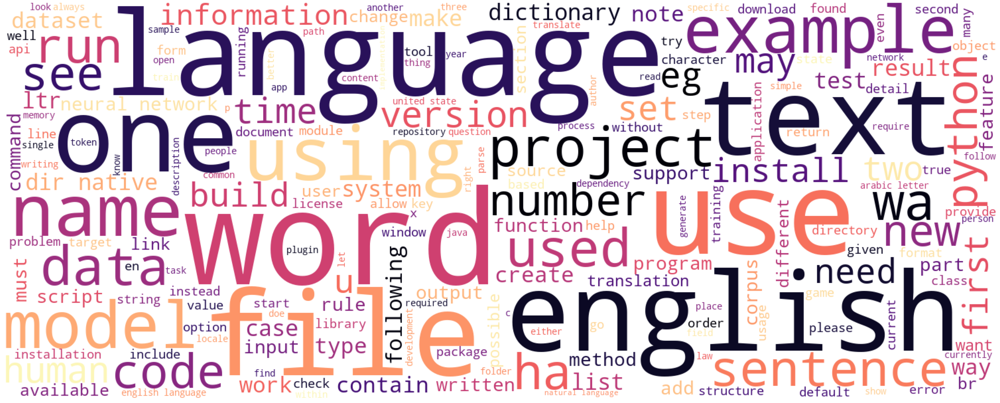

In [18]:
# Wordcloud based on all words accross repositories using all_words series
all_cloud = WordCloud(background_color='white', colormap='magma', height=600, width=1500,random_state=123).generate(' '.join(all_words))
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(all_cloud)

In [19]:
# Rroduce the most frequently occuring bigrams
top_20_starred_repo_bigrams = (pd.Series(nltk.ngrams(all_words, 2))
                      .value_counts()
                      .head(20))

top_20_starred_repo_bigrams

(dir, 1)                   175
(1, native)                174
(neural, network)          143
(2, 3)                     107
(english, language)         80
(united, state)             78
(3, 2)                      71
(arabic, letter)            68
(natural, language)         67
(2, 2)                      62
(pip, install)              60
('', '')                    55
(er, er)                    52
(native, '')                51
(make, sure)                47
(npm, install)              44
(2, 4)                      41
(programming, language)     40
(0, 0)                      40
(state, shall)              37
dtype: int64

In [21]:
starred_repo_bigrams = top_20_starred_repo_bigrams[3:]

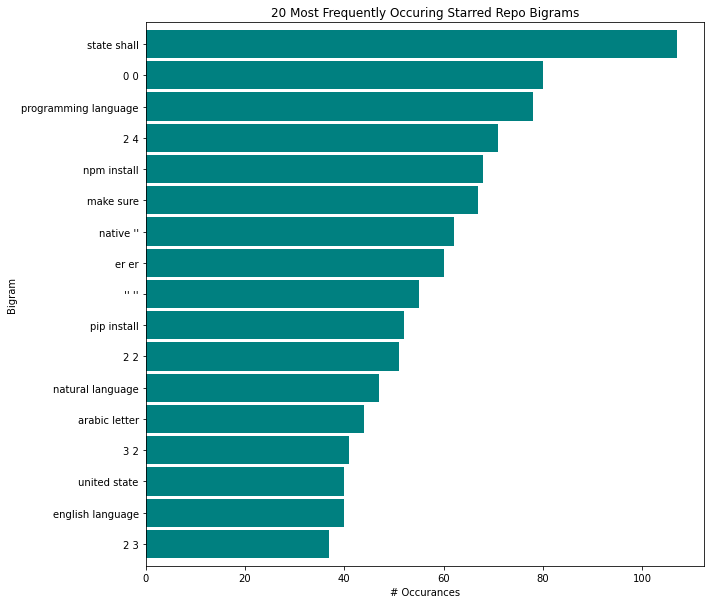

In [22]:
#Visualize 20 most frequently occuring bigrams
starred_repo_bigrams.sort_values().plot.barh(color='teal', width=.9, figsize=(10, 10))

plt.title('20 Most Frequently Occuring Starred Repo Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# Occurances')

# make the labels pretty
ticks, _ = plt.yticks()
labels = starred_repo_bigrams.reset_index()['index'].apply(lambda t: t[0] + ' ' + t[1])
_ = plt.yticks(ticks, labels)

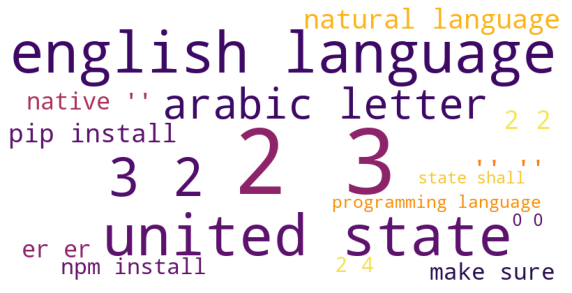

In [23]:
data = {k[0] + ' ' + k[1]: v for k, v in starred_repo_bigrams.to_dict().items()}
img = WordCloud(background_color='white',colormap='inferno', width=800, height=400).generate_from_frequencies(data)
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.show()

In [24]:
top_30_starred_repo_trigrams = (pd.Series(nltk.ngrams(all_words, 3))
                      .value_counts()
                     )

top_30_starred_repo_trigrams

(dir, 1, native)                                      174
(2, 3, 2)                                              70
('', '', '')                                           45
(1, native, '')                                        43
(er, er, er)                                           42
                                                     ... 
(2017, perhaps, 2018)                                   1
(compile, 'comcrevationngtimecrevngtime11', usage)      1
(module, info, lang)                                    1
(mickey, also, need)                                    1
(testing, crossvalidation, setting)                     1
Length: 116050, dtype: int64

In [25]:
starred_repo_trigrams = top_30_starred_repo_trigrams[20:51]

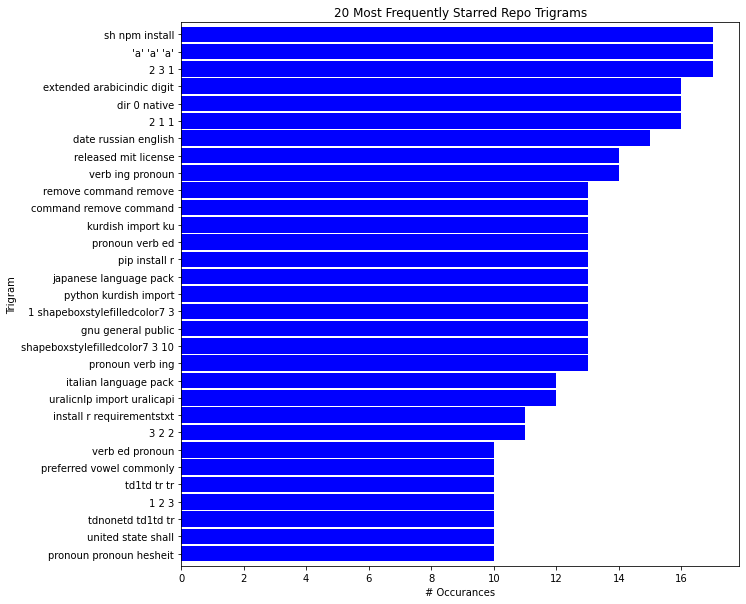

In [26]:
#Plot 20 most frequently starred repo trigrams
starred_repo_trigrams.sort_values().plot.barh(color='blue', width=.9, figsize=(10, 10))

plt.title('20 Most Frequently Starred Repo Trigrams')
plt.ylabel('Trigram')
plt.xlabel('# Occurances')

# make the labels pretty
ticks, _ = plt.yticks()
labels = starred_repo_trigrams.reset_index()['index'].apply(lambda t: t[0] + ' ' + t[1] + ' ' + t[2])
_ = plt.yticks(ticks, labels)

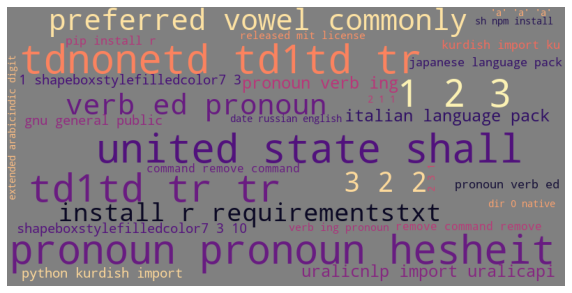

In [27]:
#Trigram wordcloud
data = {k[0] + ' ' + k[1] + ' ' + k[2]: v for k, v in starred_repo_trigrams.to_dict().items()}
img = WordCloud(background_color='grey', colormap='magma', width=800, height=400).generate_from_frequencies(data)
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.show()

In [28]:
top_20_starred_repo_trigrams = (pd.Series(nltk.ngrams(all_words, 3))
                      .value_counts()
                     )
top_20_starred_repo_trigrams

(dir, 1, native)                                      174
(2, 3, 2)                                              70
('', '', '')                                           45
(1, native, '')                                        43
(er, er, er)                                           42
                                                     ... 
(2017, perhaps, 2018)                                   1
(compile, 'comcrevationngtimecrevngtime11', usage)      1
(module, info, lang)                                    1
(mickey, also, need)                                    1
(testing, crossvalidation, setting)                     1
Length: 116050, dtype: int64

In [29]:
#How many counts per language
df.language.value_counts().head()

Python              104
JavaScript           54
Jupyter Notebook     30
Java                 30
PHP                  21
Name: language, dtype: int64

In [30]:
# Rename language columns
python = df[df.language == 'Python']
javascript = df[df.language == 'JavaScript']
java = df[df.language == 'Java']
jupyter_notebook = df[df.language == 'Jupyter Notebook']
php = df[df.language == 'PHP']

In [31]:
#Joining all txt + Remove stopwaords from each language column
python_words = ' '.join(python.stopwords_removed)
javascript_words = ' '.join(javascript.stopwords_removed)
java_words = ' '.join(java.stopwords_removed)
jupyter_notebook_words = ' '.join(jupyter_notebook.stopwords_removed)
php_words = ' '.join(php.stopwords_removed)

In [32]:
#value counts of words in python
python_freq = pd.Series(python_words.split()).value_counts()
python_freq.head()

language    402
model       309
word        305
english     299
python      255
dtype: int64

In [33]:
#value counts of words in javascript
javascript_freq = pd.Series(javascript_words.split()).value_counts()
javascript_freq.head()

1         222
name      222
native    195
dir       185
ltr       175
dtype: int64

In [34]:
#value counts of words in jupyter notebook
jupyter_notebook_freq = pd.Series(jupyter_notebook_words.split()).value_counts()
jupyter_notebook_freq.head()

key         86
model       81
language    76
english     59
finger      57
dtype: int64

In [35]:
#value counts of words in java
java_freq = pd.Series(java_words.split()).value_counts()
java_freq.head()

pronoun     89
er          67
verb        57
img         52
language    52
dtype: int64

In [37]:
#value counts of words in PHP
php_freq = pd.Series(java_words.split()).value_counts()
php_freq.head()

pronoun     89
er          67
verb        57
img         52
language    52
dtype: int64

In [36]:
# combining all words across all languages
all_words = python_words + javascript_words + java_words + jupyter_notebook_words + php_words

In [39]:
#Checking value counts of all words
all_freq = pd.Series(all_words.split()).value_counts()
all_freq.head()

language    786
english     529
word        475
1           465
model       425
dtype: int64

In [40]:
#DataFrame counting all words across all language subsets
word_counts = (pd.concat([all_freq,python_freq,javascript_freq,java_freq,jupyter_notebook_freq,php_freq], axis=1, sort=True)
                .set_axis(['All','Python','Javascript','Java','Jupyter Notebook','PHP'], axis=1, inplace=False)
                .fillna(0)
                .apply(lambda s: s.astype(int)))

word_counts.head()

,All,Python,Javascript,Java,Jupyter Notebook,PHP
',62,28,20,0,6,0
'',161,78,69,0,4,0
''''',1,1,0,0,0,0
''''''''''''',1,1,0,0,0,0
'''sereleskar,1,1,0,0,0,0


In [41]:
#Count all words sorted by all languages
word_counts.sort_values(by='All', ascending=False).head(10)

,All,Python,Javascript,Java,Jupyter Notebook,PHP
language,786,402,136,52,76,52
english,529,299,83,39,59,39
word,475,305,50,17,41,17
1,465,156,222,13,37,13
model,425,309,21,9,81,9
file,350,217,44,50,16,50
use,350,177,59,38,38,38
text,317,214,22,11,34,11
name,300,40,222,9,8,9
2,284,132,33,16,33,16


Text(0.5, 1.0, 'Proportion of Programming Languages for the 20 Most Common Words')

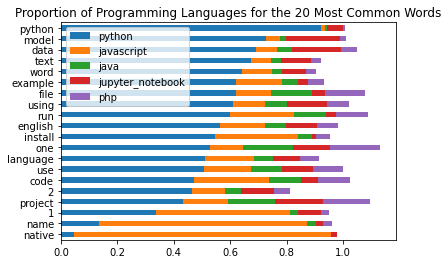

In [144]:
#Plot Proportion of Programming Languages for the 20 Most Common Words
(word_counts
 .assign(python=word_counts['Python'] / word_counts['All'],
         javascript=word_counts.Javascript / word_counts['All'],
         java=word_counts.Java / word_counts['All'],
         jupyter_notebook=word_counts['Jupyter Notebook'] / word_counts['All'],
         php=word_counts.PHP / word_counts['All'])
 .sort_values(by='All')
 [['python', 'javascript','java','jupyter_notebook','php']]
 .tail(20)
 .sort_values('python')
 .plot.barh(stacked=True))

plt.title('Proportion of Programming Languages for the 20 Most Common Words')

Text(0.5, 1.0, 'Python Repo Language Wordcloud')

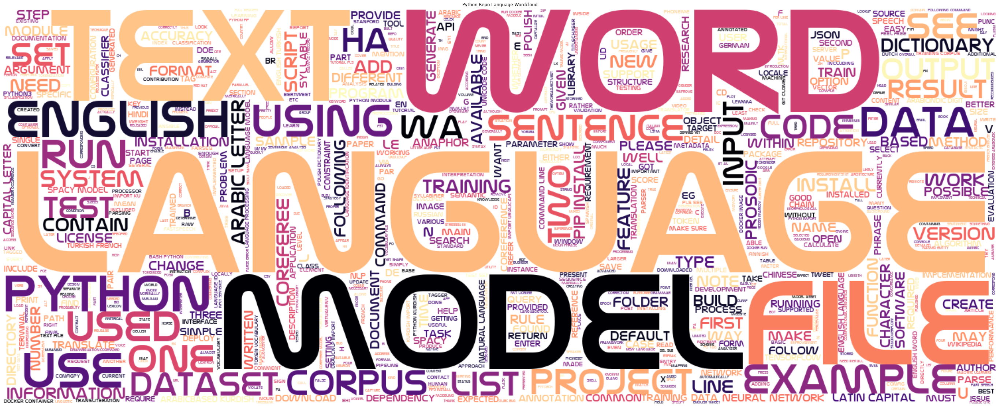

In [45]:
font_path = 'nasalization_rg.ttf'
python_cloud = WordCloud(max_words=None,font_path=font_path,background_color='white', colormap='magma', height=600, width=1500,random_state=123).generate(python_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(python_cloud)
plt.title('Python Repo Language Wordcloud')

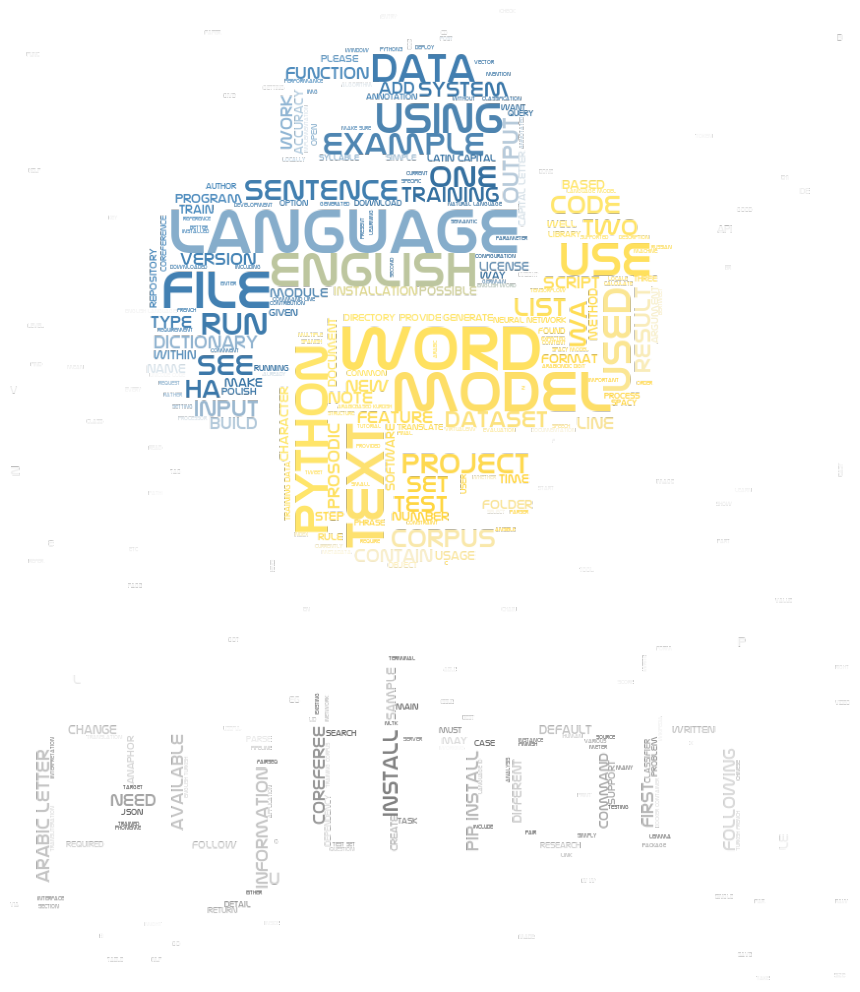

In [46]:
#Python mask wordcloud
mask= np.array(Image.open('python_logo.png'))
mask_colors = ImageColorGenerator(mask)
python_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(python_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(python_cloud)

Text(0.5, 1.0, 'Javascript Repo Language Wordcloud')

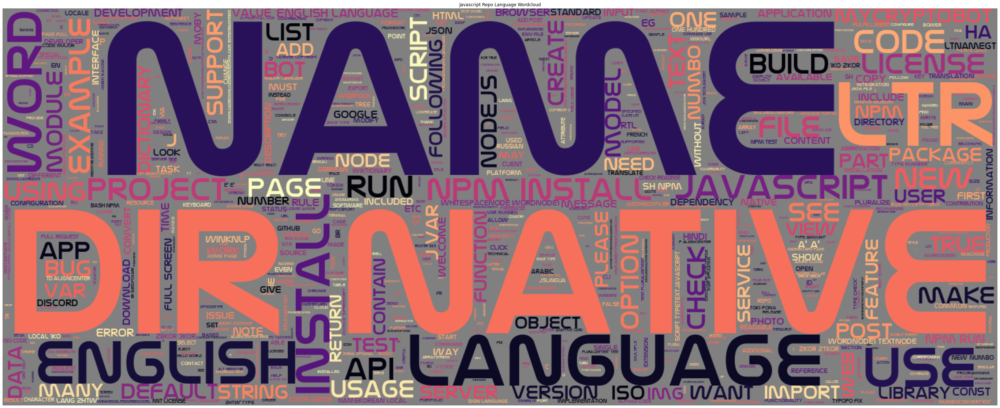

In [47]:
font_path = 'nasalization_rg.ttf'
javascript_cloud = WordCloud(max_words=None,font_path=font_path,background_color='grey', colormap='magma', height=600, width=1500,random_state=123).generate(javascript_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(javascript_cloud)
plt.title('Javascript Repo Language Wordcloud')

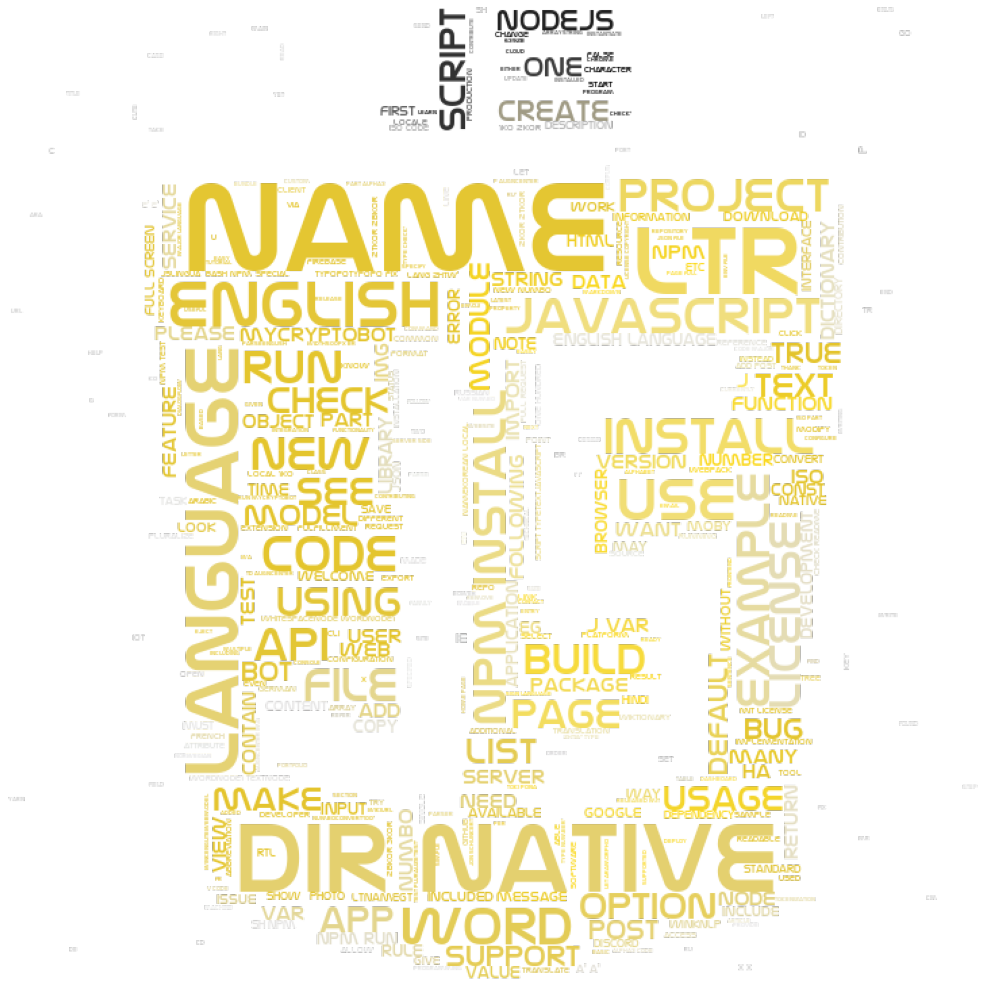

In [48]:
#Javascript mask wordcloud
mask = np.array(Image.open('javascript_logo.jpg'))
mask_colors = ImageColorGenerator(mask)
javascript_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(javascript_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(javascript_cloud)

Text(0.5, 1.0, 'Java Repo Language Wordcloud')

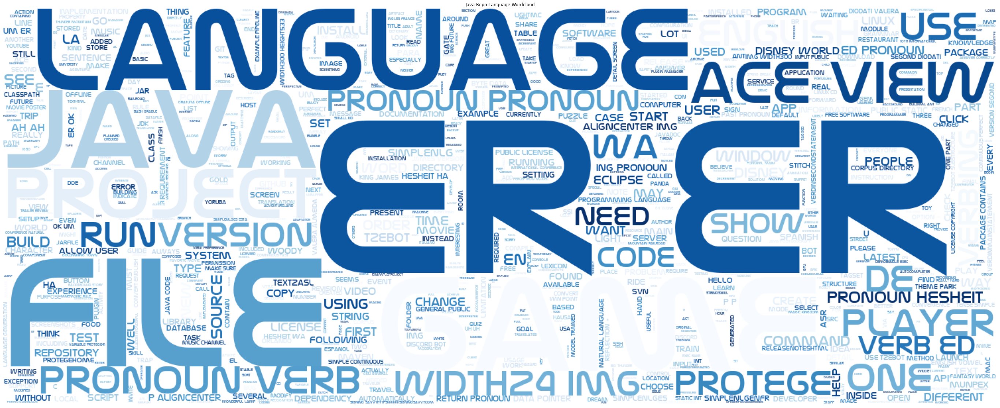

In [49]:
font_path = 'nasalization_rg.ttf'
java_cloud = WordCloud(max_words=None,font_path=font_path,background_color='white', colormap='Blues', height=600, width=1500,random_state=123).generate(java_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(java_cloud)
plt.title('Java Repo Language Wordcloud')

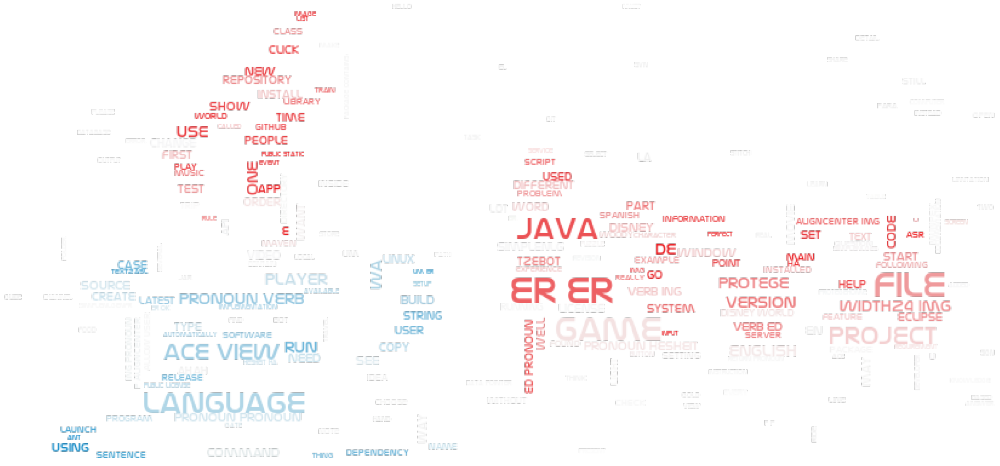

In [50]:
#Java mask cloud wordcloud
mask = np.array(Image.open('java_logo.jpg'))
mask_colors = ImageColorGenerator(mask)
java_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(java_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(java_cloud)

Text(0.5, 1.0, 'Jupyter Notebook Repo Language Wordcloud')

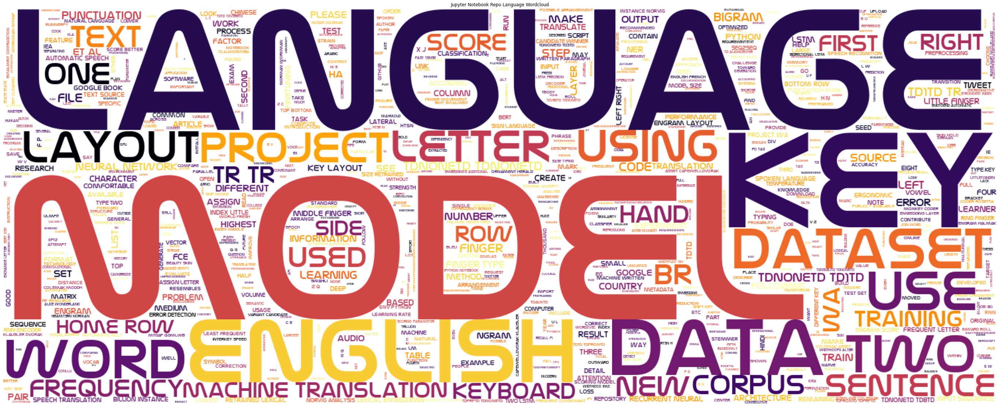

In [51]:
font_path = 'nasalization_rg.ttf'
jupyter_notebook_cloud = WordCloud(max_words=None,font_path=font_path,background_color='white', colormap='inferno', height=600, width=1500,random_state=123).generate(jupyter_notebook_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(jupyter_notebook_cloud)
plt.title('Jupyter Notebook Repo Language Wordcloud')

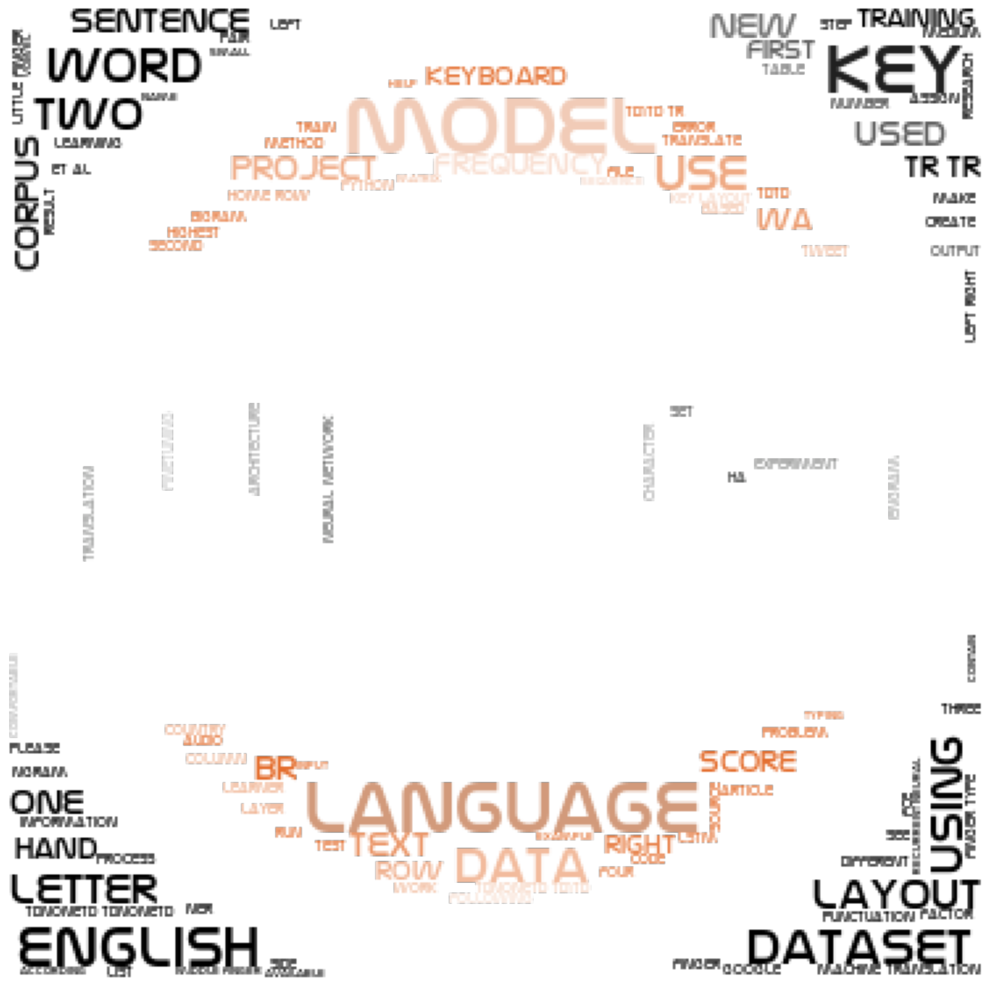

In [52]:
#Jupyter notebook mask wordcloud
mask = np.array(Image.open('jupyter_notebook_logo.png'))
mask_colors = ImageColorGenerator(mask)
jupyter_notebook_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(jupyter_notebook_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(jupyter_notebook_cloud)

Text(0.5, 1.0, 'PHP Repo Language Wordcloud')

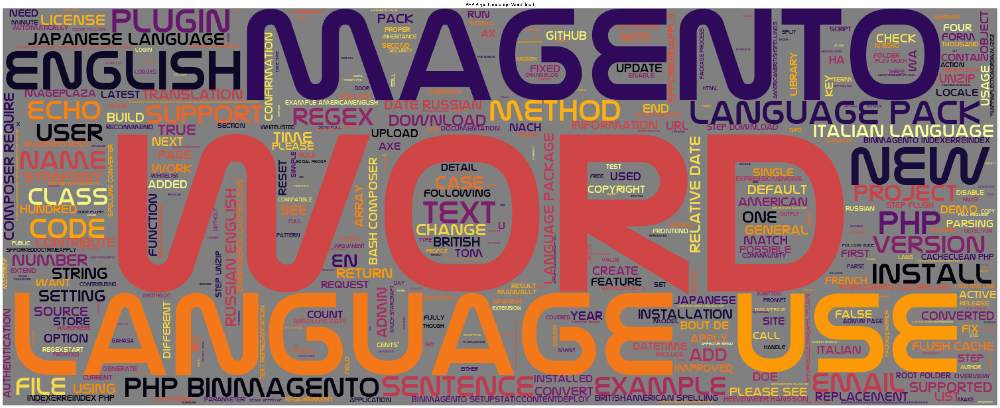

In [53]:
font_path = 'nasalization_rg.ttf'
php_cloud = WordCloud(max_words=None,font_path=font_path,background_color='grey', colormap='inferno', height=600, width=1500,random_state=123).generate(php_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(php_cloud)
plt.title('PHP Repo Language Wordcloud')

In [ ]:
#PHP Mask Wordcloud
mask = np.array(Image.open('php_logo.png'))
mask_colors = ImageColorGenerator(mask)
php_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(php_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(php_cloud)

Text(0.5, 1.0, 'All Repos Language Wordcloud')

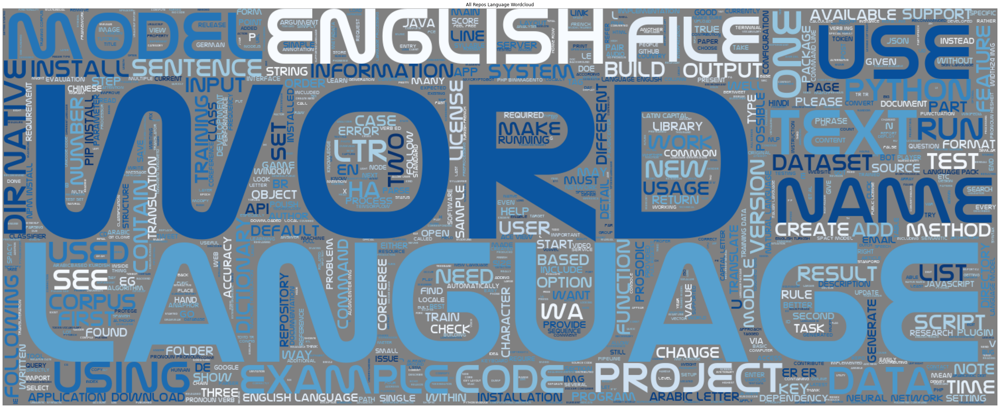

In [54]:
font_path = 'nasalization_rg.ttf'
all_cloud = WordCloud(max_words=None,font_path=font_path,background_color='grey', colormap='Blues', height=600, width=1500,random_state=123).generate(all_words)
plt.figure(figsize=(100,20))
plt.axis('off')
plt.imshow(all_cloud)
plt.title('All Repos Language Wordcloud')

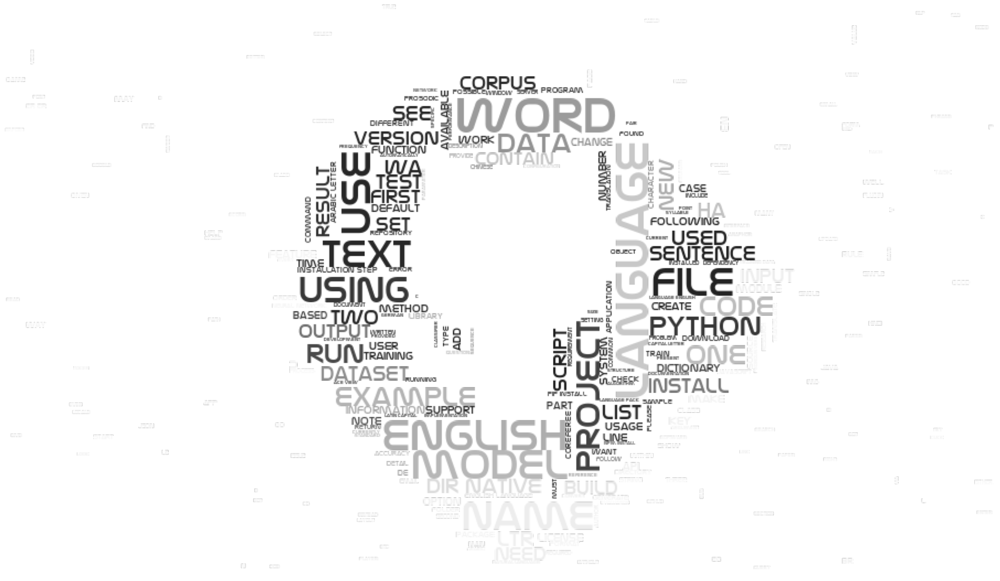

In [55]:
#Mask Wordcloudd for All Languages
mask = np.array(Image.open('github_logo.jpg'))
mask_colors = ImageColorGenerator(mask)
all_cloud = WordCloud(mask=mask,
                         width=mask.shape[1],
                         height=mask.shape[0],
                         max_words=5000,
                         font_path=font_path,
                         background_color=None,
                         mode='RGBA',
                         color_func=mask_colors,
                         random_state=45                         
                         ).generate(all_words)
plt.figure(figsize=(100, 18))
plt.axis('off')
plt.imshow(all_cloud)

### Explore Takeaways:
   * Majority of the Repositories were in Python programming language.
   * Many of the same words were spread across all the top 5 programming languages making for a unreliable prediction.
   * May find prediction to be difficult given the amount of common words used.

# Modeling

In [56]:
#Checking values to determine either a median or a mode
df.language.value_counts()

Python                   104
JavaScript                54
Jupyter Notebook          30
Java                      30
PHP                       21
HTML                      16
Ruby                      12
C++                       11
C                          9
Go                         8
C#                         6
Swift                      6
TeX                        5
Shell                      4
TypeScript                 4
Objective-C                3
Common Lisp                3
CSS                        3
Kotlin                     3
Dart                       2
Rust                       2
PowerShell                 2
Smalltalk                  2
Vue                        1
XQuery                     1
Roff                       1
Scala                      1
FreeMarker                 1
LilyPond                   1
PLpgSQL                    1
OpenEdge ABL               1
Julia                      1
R                          1
Grammatical Framework      1
Lex           

In [57]:
#Top five language column
top_5_languages = ['Python','JavaScript','Jupyter Notebook','Java','PHP']

In [58]:
#New df using top 5 languages
df2 = df[df.language.isin(top_5_languages)][['repo','language','stopwords_removed']]
df2.head()

,repo,language,stopwords_removed
1,ansible/ansible,Python,pypi version doc badge chat badge build status...
2,TensorSpeech/TensorFlowTTS,Python,h2 aligncenter p yum tensorflowtts p aligncent...
3,plurals/pluralize,JavaScript,pluralize npm versionnpmimagenpmurl npm downlo...
6,wapmorgan/Morphos,PHP,english pluralizationpluralization numeralsnum...
7,ChenYCL/chrome-extension-udemy-translate,JavaScript,p aligncenter img srchttpsgithubcomchenyclchro...


In [60]:
#Setting Baseline with Python as the mode
print(f'Baseline Accuracy: {round(104 / df2.shape[0] *100)}%')

Baseline Accuracy: 44%


In [61]:
train, validate, test = split(df2,'language')
train.head()

,repo,language,stopwords_removed
102,shenhuanet/Ocr-android,Java,ocrandroid httpsjitpackiovshenhuanetocrandroid...
55,chrisjbryant/lmgec-lite,Python,lmgeclite repository contains language model b...
59,notAI-tech/DeepTranslit,Python,deeptranslit towards better transliteration in...
125,mageplaza/magento-2-italian-language-pack,PHP,magento 2 italian language pack magento 2 ital...
182,cetinsamet/pos-tagging,Python,postagger implementation partofspeech tagger e...


In [62]:
# Setup our X variables
X_train = train.stopwords_removed
X_validate = validate.stopwords_removed
X_test = test.stopwords_removed

In [63]:
# Setup our y variables
y_train = train.language
y_validate = validate.language
y_test = test.language

In [64]:
X_train.head()

102    ocrandroid httpsjitpackiovshenhuanetocrandroid...
55     lmgeclite repository contains language model b...
59     deeptranslit towards better transliteration in...
125    magento 2 italian language pack magento 2 ital...
182    postagger implementation partofspeech tagger e...
Name: stopwords_removed, dtype: object

In [65]:
# Create the tfidf vectorizer object
# Step 1, this creates a tf-idf values for each word, for each document
# Step 2, encodes these values so that we can use models that only work on numbers, like classifications model
tfidf = TfidfVectorizer()

# Fit on the training data
tfidf.fit(X_train)

# Use the object
X_train_vectorized = tfidf.transform(X_train)
X_validate_vectorized = tfidf.transform(X_validate)
X_test_vectorized = tfidf.transform(X_test)

In [67]:
#Check shape of X_Train
X_train_vectorized.todense().shape

(133, 10655)

# Logistic Regression

In [68]:
# Now that we have a vectorized dataset, we can use our classification tools!
lm = LogisticRegression(class_weight='balanced',solver='liblinear',random_state=123)

# Fit the classification model on our vectorized train data
lm.fit(X_train_vectorized, y_train)

LogisticRegression(class_weight='balanced', random_state=123,
                   solver='liblinear')

In [69]:
train = pd.DataFrame(dict(actual=y_train))
validate = pd.DataFrame(dict(actual=y_validate))
test = pd.DataFrame(dict(actual=y_test))

In [70]:
# Use the trained model to predict y given those vectorized inputs of X
train['predicted'] = lm.predict(X_train_vectorized)
validate["predicted"] = lm.predict(X_validate_vectorized)
test['predicted'] = lm.predict(X_test_vectorized)

In [71]:
train.head()

,actual,predicted
102,Java,Java
55,Python,Python
59,Python,Python
125,PHP,PHP
182,Python,Python


In [72]:
# Train Accuracy
(train.actual == train.predicted).mean()

0.9699248120300752

In [73]:
# Out of sample accuracy
(validate.actual == validate.predicted).mean()

0.5689655172413793

In [77]:
#from sklearn.metrics import classification_report
print(classification_report(train.actual, train.predicted))

                  precision    recall  f1-score   support

            Java       1.00      0.94      0.97        16
      JavaScript       1.00      1.00      1.00        30
Jupyter Notebook       1.00      0.88      0.94        17
             PHP       1.00      0.92      0.96        12
          Python       0.94      1.00      0.97        58

        accuracy                           0.97       133
       macro avg       0.99      0.95      0.97       133
    weighted avg       0.97      0.97      0.97       133



In [78]:
print(classification_report(validate.actual, validate.predicted))

                  precision    recall  f1-score   support

            Java       1.00      0.12      0.22         8
      JavaScript       1.00      0.46      0.63        13
Jupyter Notebook       1.00      0.14      0.25         7
             PHP       0.00      0.00      0.00         5
          Python       0.50      1.00      0.67        25

        accuracy                           0.57        58
       macro avg       0.70      0.35      0.35        58
    weighted avg       0.70      0.57      0.49        58



### K Nearest Nieghbors Model

In [80]:
#Create the KNN object with a k = 5
knn = KNeighborsClassifier(n_neighbors=10, weights='uniform')

#Fit the object to the vectorized training data
knn.fit(X_train_vectorized, y_train)

#Create corresponding dataframes for the actual values of the categories that correspond to each article
train = pd.DataFrame(dict(actual=y_train))
validate = pd.DataFrame(dict(actual=y_validate))
test = pd.DataFrame(dict(actual=y_test))

#Form predictions uisng the knn model
train['predicted'] = knn.predict(X_train_vectorized)
validate["predicted"] = knn.predict(X_validate_vectorized)
test['predicted'] = knn.predict(X_test_vectorized)

#Review how the knn model performed on the in-sample data
print(classification_report(train.actual, train.predicted))

#Review how the knn model performed on the out-of-sample data
print(classification_report(validate.actual, validate.predicted, zero_division=0))

                  precision    recall  f1-score   support

            Java       0.75      0.56      0.64        16
      JavaScript       1.00      0.60      0.75        30
Jupyter Notebook       0.44      0.82      0.57        17
             PHP       0.67      0.50      0.57        12
          Python       0.71      0.76      0.73        58

        accuracy                           0.68       133
       macro avg       0.71      0.65      0.65       133
    weighted avg       0.74      0.68      0.69       133

                  precision    recall  f1-score   support

            Java       0.50      0.12      0.20         8
      JavaScript       0.43      0.23      0.30        13
Jupyter Notebook       0.32      0.86      0.46         7
             PHP       0.20      0.20      0.20         5
          Python       0.64      0.64      0.64        25

        accuracy                           0.47        58
       macro avg       0.42      0.41      0.36        58
    weigh

### Random Forest Model


In [81]:
#Create the RF object
rf = RandomForestClassifier(bootstrap=True, 
                            class_weight=None, 
                            criterion='gini',
                            min_samples_leaf=2,
                            n_estimators=100,
                            max_depth=15, 
                            random_state=123)

#Fit the RF object to the training data
rf.fit(X_train_vectorized, y_train)

#Predict on y
y_pred = rf.predict(X_train_vectorized)

#Evaluate
print(classification_report(y_train, y_pred))

                  precision    recall  f1-score   support

            Java       1.00      0.81      0.90        16
      JavaScript       1.00      0.93      0.97        30
Jupyter Notebook       1.00      0.76      0.87        17
             PHP       1.00      0.75      0.86        12
          Python       0.83      1.00      0.91        58

        accuracy                           0.91       133
       macro avg       0.97      0.85      0.90       133
    weighted avg       0.93      0.91      0.91       133



In [82]:
# Predict on validate
y_pred = rf.predict(X_validate_vectorized)
# Evaluate model performance on out-of-sample data
print(classification_report(y_validate, y_pred, zero_division=0))

                  precision    recall  f1-score   support

            Java       0.00      0.00      0.00         8
      JavaScript       1.00      0.46      0.63        13
Jupyter Notebook       0.00      0.00      0.00         7
             PHP       0.00      0.00      0.00         5
          Python       0.48      1.00      0.65        25

        accuracy                           0.53        58
       macro avg       0.30      0.29      0.26        58
    weighted avg       0.43      0.53      0.42        58



In [83]:
#peek at test
test

,actual,predicted
241,Python,Jupyter Notebook
370,PHP,PHP
208,Java,Java
312,Python,Python
254,Python,Python
211,JavaScript,Python
37,JavaScript,JavaScript
342,Python,Python
100,Python,Jupyter Notebook
274,Python,Jupyter Notebook


In [84]:
print(classification_report(test.actual, test.predicted))

                  precision    recall  f1-score   support

            Java       0.60      0.50      0.55         6
      JavaScript       1.00      0.27      0.43        11
Jupyter Notebook       0.15      0.33      0.21         6
             PHP       0.60      0.75      0.67         4
          Python       0.50      0.52      0.51        21

        accuracy                           0.46        48
       macro avg       0.57      0.48      0.47        48
    weighted avg       0.59      0.46      0.47        48



# Modeling Takeaways:
  * Used Python programming as the baseline.
       - 44 % accuracy

* Applied classification modeling methodology to approach the problem.

* Logistic Regression model was selected as MVP,but only beat my baseline by 2%

# Conclusion
* Majority of the Repositories were in the Python programming language.
* Many of the same words were spread across all the top 5 programming languages making for a unreliable prediction.
* Logistic Regression was my best performing model over all.(46% accuracy)

* If i had more time:
    - Would attempt to scrape far more repositories in an effort to diversify the languages and words found in the READMES.
    - Would attempt different modeling approaches.
